In [ ]:
!pip install -U tensorflow-addons tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.1/612.1 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.1/524.1 MB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 76.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 93.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 38.6 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.7.1
    Uninstalling typing_extensions-4.7.1:
      Successfully uninstalled typing_extensions-4.7.1
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.12.0
    Uninstalling tensorflow-estimator-2.12.0:
      Successfully uninstalled tensorflow-estimator-2.12.0
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      Successfully uninstalled keras-2.12.0
  Attempting uninstall: tensorboard
    F

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/content/drive/MyDrive/NH-HAZE/GT
/content/drive/MyDrive/NH-HAZE/hazy
(384, 384, 3)


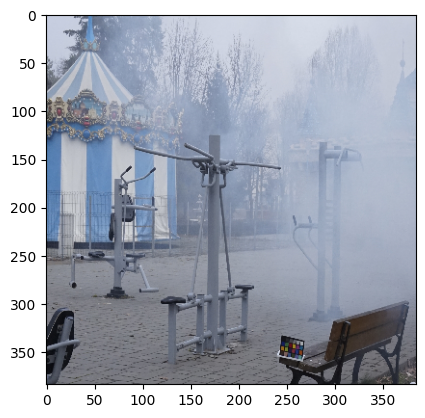

(384, 384, 3)


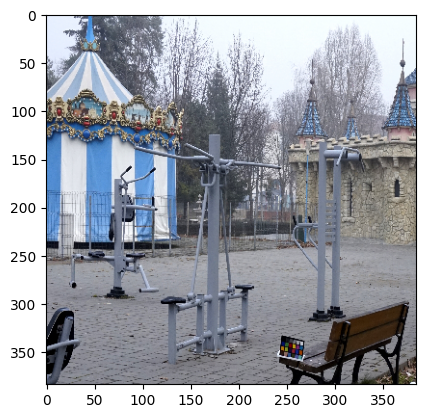

In [ ]:
import time
from tensorflow.keras.optimizers import Adam
from matplotlib import pyplot as plt
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img
import math
from keras.models import Model
from keras.layers import Input, Activation, BatchNormalization, Conv2D, Conv3D
from keras.layers import Lambda, Concatenate, MaxPooling2D, Maximum, Add
from keras.initializers import RandomNormal
from keras.optimizers import SGD
from keras.losses import MeanSquaredError
from keras.callbacks import Callback, LearningRateScheduler
from keras.utils import plot_model
import keras.backend as K
from skimage import exposure

K.set_image_data_format('channels_last')

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow


%matplotlib inline

clear_path = r'/content/drive/MyDrive/NH-HAZE/GT'
hazy_path = r'/content/drive/MyDrive/NH-HAZE/hazy'
a = 384

def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return input_image, real_image

def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, a, a, 3])
    return cropped_image[0], cropped_image[1]

def random_jitter(input_image, real_image):
    input_image, real_image = resize(input_image, real_image, 384, 384)
    input_image, real_image = random_crop(input_image, real_image)
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)
    return input_image, real_image
import re
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)

def load_images(path):
    src_list = []
    x = path
    print(x)
    for filename in sorted_alphanumeric(os.listdir(path)):
        if filename == ".ipynb_checkpoints":
            continue
        if filename == "Dehaze_GAN-SOTS.h5":
          continue
        else:
            pixels = load_img(os.path.join(x, filename), target_size=(a, a))
            pixels = tf.keras.preprocessing.image.img_to_array(pixels)
            pixels = (pixels - 127.5) / 127.5  # Normalize to [-1, 1]
            src_list.append(pixels)
    return src_list
     #Haze Removal Function
def dehaze_image(img_name):
    input_image_orig = np.asarray(Image.open(img_name)) / 255.0
    input_image = np.pad(input_image_orig, ((8, 9), (8, 9), (1, 1)), 'symmetric')

    model = TransmissionModel(input_image.shape)
    model.load_weights('transmodel_weights.h5')

    input_image = np.expand_dims(input_image, axis=0)
    trans_map_orig = model.predict(input_image)
    trans_map = trans_map_orig.reshape(input_image_orig.shape[:2])
    trans_map_refine = TransmissionRefine((input_image_orig * 255.0).astype('uint8'), trans_map)

    res_map_input = input_image_orig / np.expand_dims(trans_map_refine, axis=(0, 4))

    model = ResidualModel(res_map_input.shape[2:])
    model.load_weights('resmodel_weights.h5')
    res_map_output = model.predict(np.clip(res_map_input, 0, 2))

    haze_free_image = (res_map_input - res_map_output)
    haze_free_image = np.clip(haze_free_image, 0, 2)

    # Apply bilateral filter to smooth the dehazed image
    haze_free_image_smoothed = cv2.bilateralFilter(haze_free_image[0], d=7, sigmaColor=75, sigmaSpace=75)

    # Apply gamma correction for further enhancement
    gamma = 1.2
    haze_free_image_enhanced = np.power(haze_free_image_smoothed, gamma)

    # Apply contrast stretching for post-processing
    contrast_stretched = exposure.rescale_intensity(haze_free_image_enhanced, in_range=(0, 1), out_range=(0, 1))

    return contrast_stretched

# Load and process images:
clear = load_images(clear_path)
hazy = load_images(hazy_path)

# Resize the images to 256x256 and apply random jitter
hazy, clear = zip(*[random_jitter(h, c) for h, c in zip(hazy, clear)])

# Convert to numpy arrays
hazy = np.array(hazy, dtype='float32')
clear = np.array(clear, dtype='float32')


# Keep only the first 400 images
hazy = hazy[:400]
clear = clear[:400]

plt.imshow(0.5 * hazy[15] + 0.5)
print((0.5 * hazy[0] + 0.5).shape)
plt.show()
plt.imshow((0.5 * clear[15] + 0.5))
print((0.5 * clear[0] + 0.5).shape)
plt.show()


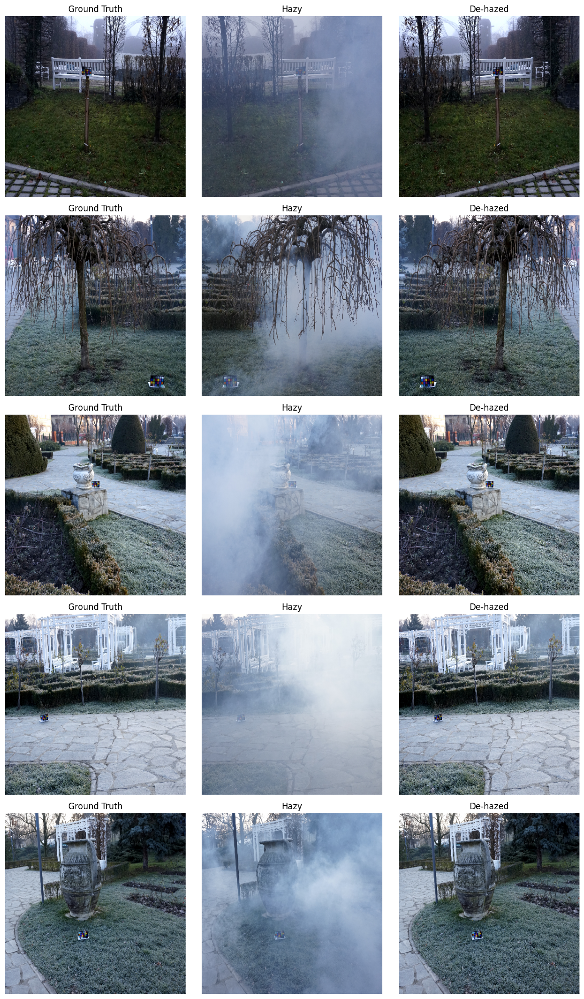

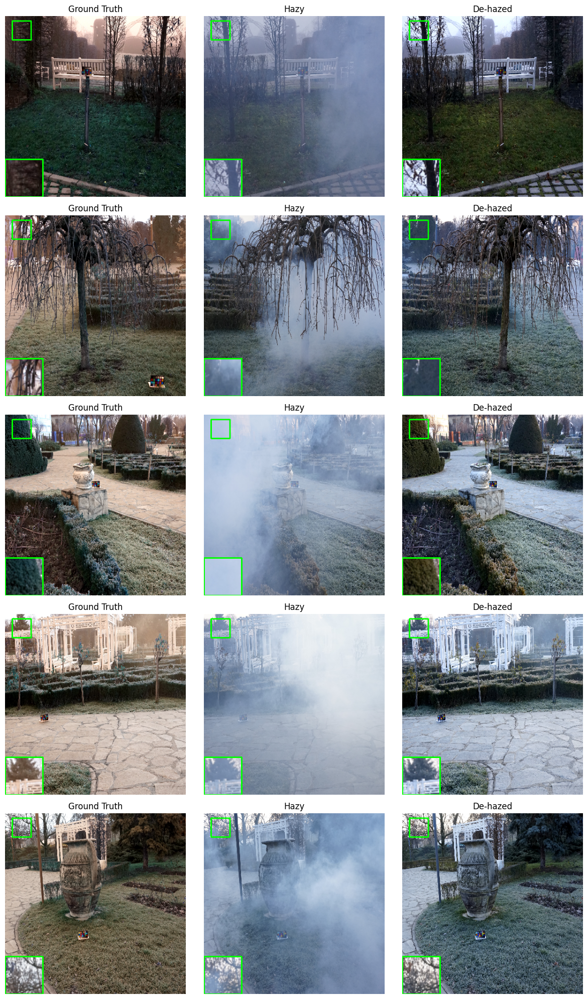

In [ ]:
D = []
import os
import cv2
for i in os.listdir("/content/drive/MyDrive/NH-HAZE/GT"):
  img = cv2.imread(os.path.join("/content/drive/MyDrive/NH-HAZE/GT",i))
  # print(i,img.shape)
  D.append(i)
  # img = cv2.resize(img,(256,256))
  # gt.append(img)
D.sort()
D  = ["/content/drive/MyDrive/NH-HAZE/GT/"+i for i in D]
gt = []
for i in D:
  img = cv2.imread(i)
  # print(i,img.shape)
  img = cv2.resize(img,(384,384))
  gt.append(img)
gt = np.array(gt)

import matplotlib.pyplot as plt
import cv2

# Replace these with your actual data
gt_samples = gt  # List of Ground Truth images
hazy_samples = hazy  # List of Hazy images
clear_samples = clear  # List of De-hazed images

num_samples = 5

plt.figure(figsize=(12, 4 * num_samples))  # Adjust the figure size as needed

for i in range(num_samples):
    # Plot the Ground Truth image
    plt.subplot(num_samples, 3, 3 * i + 1)
    plt.title("Ground Truth")
    plt.imshow(cv2.cvtColor(gt_samples[i], cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Plot the Hazy image
    plt.subplot(num_samples, 3, 3 * i + 2)
    plt.title("Hazy")
    plt.imshow(0.5 * hazy_samples[i] + 0.5)
    plt.axis('off')

    # Plot the De-hazed image
    plt.subplot(num_samples, 3, 3 * i + 3)
    plt.title("De-hazed")
    plt.imshow(0.5 * clear_samples[i] + 0.5)
    plt.axis('off')

plt.tight_layout()  # To prevent overlapping of subplots
plt.show()

################################################################################################################################### BBox below

import cv2
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")
def draw_and_magnify(image, x_min, x_max, y_min, y_max, magnification_factor=2):
    # Crop the image to the specified rectangle
    cropped_image = image[y_min:y_max, x_min:x_max]

    # Resize the cropped image to create the magnified version
    height, width = cropped_image.shape[:2]
    magnified_image = cv2.resize(cropped_image, (width * magnification_factor, height * magnification_factor))

    # Get the dimensions of the magnified image
    mh, mw = magnified_image.shape[:2]

    # Place the magnified image in the left bottom corner of the original image
    image_h, image_w = image.shape[:2]
    image[image_h - mh:, 0:mw] = magnified_image

    # Define color and thickness for the bounding box
    colour = (0, 255, 0)  # Green color for the bounding box (BGR format)
    thickness = 2        # Thickness of the bounding box lines

    # Draw the bounding box on the image using the 'rectangle' function
    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), colour, thickness)
    cv2.rectangle(image, (0, image_h - mh), (mw, image_h), colour, thickness)

    return image

# Example usage:
image_path = r'/content/drive/MyDrive/NH-HAZE/hazy/01_hazy.png'
image = cv2.imread(image_path)
image = cv2.resize(image, (384, 384))
x_min = 15
x_max = 55
y_min = 10
y_max = 50

# Replace these with your actual data
num_samples = 5
hazy_samples = hazy   # Replace this with your list of hazy images
clear_samples = clear  # Replace this with your list of de-hazed images
gt_samples = gt    # Replace this with your list of ground truth images

plt.figure(figsize=(16, 4 * num_samples))  # Adjust the figure size as needed

for i in range(num_samples):
    # Plot the Ground Truth image
    plt.subplot(num_samples, 4, 4 * i + 1)
    plt.title("Ground Truth")
    gt_image = draw_and_magnify(gt_samples[i].copy(), x_min, x_max, y_min, y_max)
    plt.imshow(gt_image)
    plt.axis('off')

    # Plot the Hazy image
    plt.subplot(num_samples, 4, 4 * i + 2)
    plt.title("Hazy")
    hazy_image = 0.5 * hazy_samples[i] + 0.5
    hazy_image = draw_and_magnify(hazy_image.copy(), x_min, x_max, y_min, y_max)
    plt.imshow(hazy_image,vmin=0, vmax=255)
    plt.axis('off')

    # Plot the De-hazed image
    plt.subplot(num_samples, 4, 4 * i + 3)
    plt.title("De-hazed")
    clear_image = 0.5 * clear_samples[i] + 0.5
    clear_image = draw_and_magnify(clear_image.copy(), x_min, x_max, y_min, y_max)
    plt.imshow(clear_image,vmin=0, vmax=255)
    plt.axis('off')

plt.tight_layout()  # To prevent overlapping of subplots
plt.show()



In [ ]:
# to save the images in colab
plt.imsave("A1.png",(0.5 * clear[25] + 0.5))

plt.imsave("A2.png",0.5 * hazy[25] + 0.5)


In [ ]:
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio
peak_signal_noise_ratio??

In [ ]:
import numpy as np
import cv2
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

# Load the original and dehazed images
original_image = np.asarray(Image.open("//content/drive/MyDrive/O_HAZE PSNR2/x/A1.png"))/255.0
original_image = cv2.resize(original_image,(384,384))
original_image = original_image[:,:,0]
# original_image.shape
# original_image = cv2.resize(original_image, (384,384))
dehazed_image = np.asarray(Image.open("//content/drive/MyDrive/O_HAZE PSNR2/z/26_outdoor_GT.jpg"))/255.0
dehazed_image = dehazed_image[:,:,0]
dehazed_image = cv2.resize(dehazed_image,(384,384))

# Calculate MSE
mse_score = mean_squared_error(original_image, dehazed_image)

# Calculate PSNR
psnr_score = peak_signal_noise_ratio(original_image, dehazed_image, data_range=2.0)
# Calculate SSIM
ssim_score = ssim(np.squeeze(original_image), np.squeeze(dehazed_image), data_range=5.0)

# Print the scores
print("MSE:", mse_score)
print("PSNR:", psnr_score)
print("SSIM:", ssim_score)


MSE: 0.0003806795054506111
PSNR: 40.21500494889996
SSIM: 0.9933604852527769


In [ ]:
original_image.shape,dehazed_image.shape

((256, 256), (256, 256))

In [ ]:
np.squeeze(original_image).shape

(256, 256)

In [ ]:
original_image.shape,dehazed_image.shape

((256, 256), (256, 256))

In [ ]:
print(hazy.shape)

(55, 256, 256, 3)


In [ ]:
import keras
import tensorflow as tf
from keras.optimizers import Adam, Lion
from keras.losses import mae
from keras.initializers import RandomNormal
from keras.models import Model
from keras.layers import Input, Conv2D, Conv2DTranspose, LeakyReLU, Activation, Concatenate, Dropout, BatchNormalization
from matplotlib import pyplot as plt
from os import listdir
import cv2
import numpy as np
import os
import tensorflow.keras.applications.vgg19 as vgg19
from tensorflow.keras.losses import mean_absolute_error
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error



def psnr(original, compressed):
    # Calculate the mean squared error (MSE) using TensorFlow
    mse = tf.reduce_mean(tf.square(original - compressed))

    # Calculate the peak signal-to-noise ratio (PSNR)
    max_pixel = 1.0
    psnr = 20 * tf.math.log(max_pixel / tf.sqrt(mse)) / tf.math.log(10.0)

    return psnr


def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_src_image = Input(shape=image_shape)
    # target image input
    in_target_image = Input(shape=image_shape)
    merged = Concatenate()([in_src_image, in_target_image])
    d = Conv2D(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(alpha=0.2)(d)
    d = Conv2D(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(d)
    d = LeakyReLU(alpha=0.2)(d)
    d = Conv2D(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(d)
    d = LeakyReLU(alpha=0.2)(d)
    d = Conv2D(512, (4, 4), strides=(1, 1), padding='valid', kernel_initializer=init)(d)
    d = LeakyReLU(alpha=0.2)(d)
    d = Conv2D(1, (4, 4), strides=(1, 1), padding='valid', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(d)
    model = Model([in_src_image, in_target_image], patch_out, name='discriminator')
    # compile model
    return model


def define_encoder_block(layer_in, n_filters, batchnorm=False):
    init = RandomNormal(stddev=0.02)
    # add downsampling layer
    g = Conv2D(n_filters, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(layer_in)
    # conditionally add batch normalization
    if batchnorm:
        g = BatchNormalization(momentum=0.8)(g, training=True)
    # leaky relu activation
    g = LeakyReLU(alpha=0.2)(g)
    return g


def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    init = RandomNormal(stddev=0.02)
    # add upsampling layer
    g = Conv2DTranspose(n_filters, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(layer_in)

    if dropout:
        g = Dropout(0.5)(g, training=True)
    # merge with skip connection
    g = Concatenate()([g, skip_in])
    # relu activation
    g = LeakyReLU(alpha=0.2)(g)
    return g


class TransformerGenerator(Model):
    def __init__(self, image_shape):
        super(TransformerGenerator, self).__init__()

        init = RandomNormal(stddev=0.02)
        in_image = Input(shape=image_shape)
        e1 = define_encoder_block(in_image, 64, batchnorm=True)
        e2 = define_encoder_block(e1, 128, batchnorm=True)
        e3 = define_encoder_block(e2, 256, batchnorm=True)
        e4 = define_encoder_block(e3, 512, batchnorm=True)
        e5 = define_encoder_block(e4, 512, batchnorm=True)
        e6 = define_encoder_block(e5, 512, batchnorm=True)
        b = Conv2D(512, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(e6)
        b = Activation('relu')(b)
        d2 = decoder_block(b, e6, 512, dropout=True)
        d3 = decoder_block(d2, e5, 512, dropout=True)
        d4 = decoder_block(d3, e4, 256, dropout=True)
        d5 = decoder_block(d4, e3, 128, dropout=True)
        d6 = decoder_block(d5, e2, 64, dropout=True)
        d7 = decoder_block(d6, e1, 64, dropout=True)
        g = Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init)(d7)
        out_image = Activation('tanh')(g)
        self.generator = Model(in_image, out_image, name='generator')

    def call(self, inputs):
        return self.generator(inputs)




def discriminator_loss(real_logit, fake_logit):
    real_loss = tf.reduce_mean(tf.keras.losses.hinge(tf.ones_like(real_logit), real_logit))
    fake_loss = tf.reduce_mean(tf.keras.losses.hinge(tf.zeros_like(fake_logit), fake_logit))
    return real_loss + fake_loss


def generator_loss(fake_logit):
    return -tf.reduce_mean(fake_logit)


class WGAN(Model):
    def __init__(self, discriminator, generator, discriminator_extra_steps, gp_weight=10.0):
        super(WGAN, self).__init__()

        self.discriminator = discriminator
        self.generator = generator
        self.d_steps = discriminator_extra_steps
        self.gp_weight = gp_weight

        # Create the VGG model for feature extraction
        self.vgg = vgg19.VGG19(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
        self.vgg.trainable = False
        self.feature_extractor = tf.keras.Model(inputs=self.vgg.input, outputs=self.vgg.get_layer('block4_conv2').output)

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    def gradient_penalty(self, batch_size, real_images, fake_images, target_images):
        alpha = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            pred = self.discriminator([real_images, interpolated], training=True)

        grads = gp_tape.gradient(pred, [interpolated])[0]
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, data):
        real_images, target_images = data
        if isinstance(real_images, tuple):
            real_images = real_images[0]
        if isinstance(target_images, tuple):
            target_images = target_images[0]

        batch_size = tf.shape(real_images)[0]
        d_loss_f = 0
        for i in range(self.d_steps):
            # Get the latent vector
            with tf.GradientTape() as tape:
                # Generate fake images from the latent vector
                fake_images = self.generator(real_images, training=True)
                l1 = mean_absolute_error(real_images, fake_images)

                fake_logits = self.discriminator([real_images, fake_images], training=True)
                real_logits = self.discriminator([real_images, target_images], training=True)

                d_loss = self.d_loss_fn(real_logits, fake_logits)
                d_loss_f = d_loss_f + d_loss

            d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
            self.d_optimizer.apply_gradients(zip(d_gradient, self.discriminator.trainable_variables))
        d_loss_f = tf.reduce_mean(d_loss_f)

        with tf.GradientTape() as tape, tf.GradientTape() as gtape:
            generated_images = self.generator(real_images, training=True)
            l1 = tf.reduce_mean(mean_absolute_error(target_images, generated_images))
            gen_img_logits = self.discriminator([real_images, generated_images], training=True)

            target_features = self.feature_extractor(0.5 * target_images + 0.5)
            generated_features = self.feature_extractor(0.5 * generated_images + 0.5)
            vgg_loss = tf.reduce_mean(tf.square(target_features - generated_features))

            g_loss = self.g_loss_fn(gen_img_logits) + 100 * l1 + 0.0001 * vgg_loss

        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gen_gradient, self.generator.trainable_variables))
        return {"d_loss": d_loss_f, "g_loss": g_loss}


a = 256
image_shape = (a, a, 3)
vgg = vgg19.VGG19(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
layer_name = 'block4_conv2'
vgg_outputs = vgg.get_layer(layer_name).output
feature_extractor = tf.keras.Model(inputs=vgg.input, outputs=vgg_outputs)
feature_extractor.trainable = False
d_model = define_discriminator(image_shape)
g_model = TransformerGenerator(image_shape)


generator_optimizer = Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)
discriminator_optimizer = Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)


epochs = 50

wgan = WGAN(discriminator=d_model, generator=g_model, discriminator_extra_steps=1)
wgan.compile(d_optimizer=discriminator_optimizer,
             g_optimizer=generator_optimizer, g_loss_fn=generator_loss, d_loss_fn=discriminator_loss)



80134624/80134624 [==============================] - 3s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [ ]:
# Training
print("Training has been started")
wgan.fit(hazy, clear, batch_size=8, epochs=epochs)

import os
os.makedirs("/content/drive/MyDrive/NH_HAZE/modelWeightFile", exist_ok=True)

# Save the generator model using SavedModel format
generator_save_path = "/content/drive/MyDrive/NH_HAZE/modelWeightFile/Dehaze_GAN-SOTS"
tf.saved_model.save(wgan.generator, generator_save_path)


Training has been started
Epoch 1/50
7/7 [==============================] - 309s 42s/step - d_loss: 1.8565 - g_loss: 42.2399
Epoch 2/50
7/7 [==============================] - 287s 41s/step - d_loss: 1.6928 - g_loss: 36.7233
Epoch 3/50
7/7 [==============================] - 314s 46s/step - d_loss: 1.7306 - g_loss: 34.0189
Epoch 4/50
7/7 [==============================] - 280s 40s/step - d_loss: 1.7454 - g_loss: 32.1857
Epoch 5/50
7/7 [==============================] - 287s 41s/step - d_loss: 1.6846 - g_loss: 33.0670
Epoch 6/50
7/7 [==============================] - 281s 40s/step - d_loss: 1.6656 - g_loss: 31.2029
Epoch 7/50
7/7 [==============================] - 278s 40s/step - d_loss: 1.6947 - g_loss: 30.7889
Epoch 8/50
7/7 [==============================] - 276s 40s/step - d_loss: 1.5830 - g_loss: 30.3250
Epoch 9/50
7/7 [==============================] - 275s 39s/step - d_loss: 1.6145 - g_loss: 28.6935
Epoch 10/50
7/7 [==============================] - 273s 39s/step - d_loss: 1.5571 -

In [ ]:
# BEllow  code are using sum

In [ ]:
import os
import shutil
os.makedirs("/content/drive/MyDrive/NH-HAZE/GT",exist_ok=True)
os.makedirs("/content/drive/MyDrive/NH-HAZE/hazy",exist_ok=True)

for i in os.listdir("//content/drive/MyDrive/NH-HAZE/hazy"):
  if "GT" in i:
    shutil.move(f"//content/drive/MyDrive/NH-HAZE/hazy/{i}",f"/content/drive/MyDrive/NH-HAZE/GT/{i}")
  print(i)

05_hazy.png
02_hazy.png
01_hazy.png
03_hazy.png
04_hazy.png
11_hazy.png
08_hazy.png
07_hazy.png
12_hazy.png
10_hazy.png
09_hazy.png
06_hazy.png
18_hazy.png
19_hazy.png
16_hazy.png
15_hazy.png
13_hazy.png
17_hazy.png
14_hazy.png
22_hazy.png
25_hazy.png
20_hazy.png
24_hazy.png
26_hazy.png
23_hazy.png
21_hazy.png
29_hazy.png
31_hazy.png
33_hazy.png
28_hazy.png
32_hazy.png
30_hazy.png
27_hazy.png
38_hazy.png
36_hazy.png
35_hazy.png
37_hazy.png
39_hazy.png
34_hazy.png
40_hazy.png
47_hazy.png
44_hazy.png
43_hazy.png
42_hazy.png
41_hazy.png
45_hazy.png
46_hazy.png
48_hazy.png
50_hazy.png
52_hazy.png
53_hazy.png
51_hazy.png
54_hazy.png
49_hazy.png
55_hazy.png


In [ ]:
import os
import shutil
os.makedirs("/content/drive/MyDrive/NH-HAZE/GT",exist_ok=True)
os.makedirs("/content/drive/MyDrive/NH-HAZE/hazy",exist_ok=True)


In [ ]:
# plt.imshow(0.5 * hazy[5] + 0.5)
hazy.shape

(55, 256, 256, 3)

In [ ]:
clear.shape

(55, 256, 256, 3)

In [ ]:
# Phani

In [ ]:
# Phani

In [ ]:
D = []
import os
import cv2
for i in os.listdir("/content/drive/MyDrive/NH-HAZE/GT"):
  img = cv2.imread(os.path.join("/content/drive/MyDrive/NH-HAZE/GT",i))
  print(i,img.shape)
  D.append(i)
  # img = cv2.resize(img,(256,256))
  # gt.append(img)

In [ ]:

D.sort()

In [ ]:
/content/drive/MyDrive/NH-HAZE/GT/01_GT.png

In [ ]:
D  = ["/content/drive/MyDrive/NH-HAZE/GT/"+i for i in D]

In [ ]:
gt = []
for i in D:
  img = cv2.imread(i)
  print(i,img.shape)
  img = cv2.resize(img,(256,256))
  gt.append(img)

/content/drive/MyDrive/NH-HAZE/GT/01_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/02_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/03_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/04_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/05_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/06_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/07_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/08_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/09_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/10_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/11_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/12_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/13_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/14_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/15_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/16_GT.png (1200, 1600, 3)
/content/drive/MyDrive/NH-HAZE/GT/17_GT.

In [ ]:
gt[15].shape

(256, 256, 3)

In [ ]:
gt = np.array(gt)

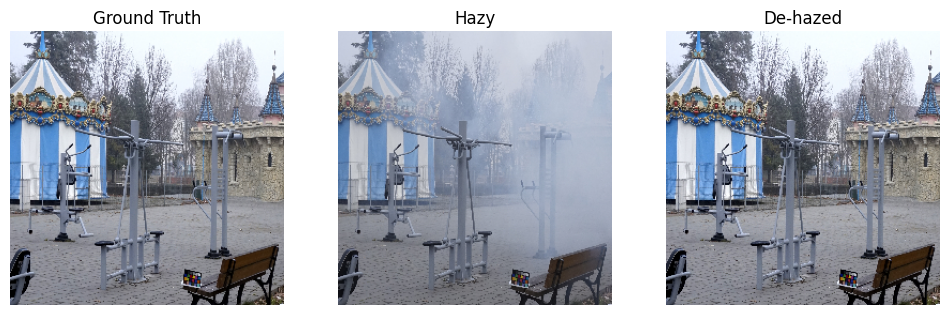

In [ ]:
# multiple images

import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(12, 4))  # Adjust the figure size as needed

# Plot the Ground Truth image
plt.subplot(1, 3, 1)
plt.title("Ground Truth")
plt.imshow(cv2.cvtColor(gt[15], cv2.COLOR_BGR2RGB))
plt.axis('off')  # Turn off the axis to remove ticks and labels

# Plot the Hazy image
plt.subplot(1, 3, 2)
plt.title("Hazy")
plt.imshow(0.5 * hazy[15] + 0.5)
plt.axis('off')

# Plot the De-hazed image
plt.subplot(1, 3, 3)
plt.title("De-hazed")
plt.imshow(0.5 * clear[15] + 0.5)
plt.axis('off')

plt.show()


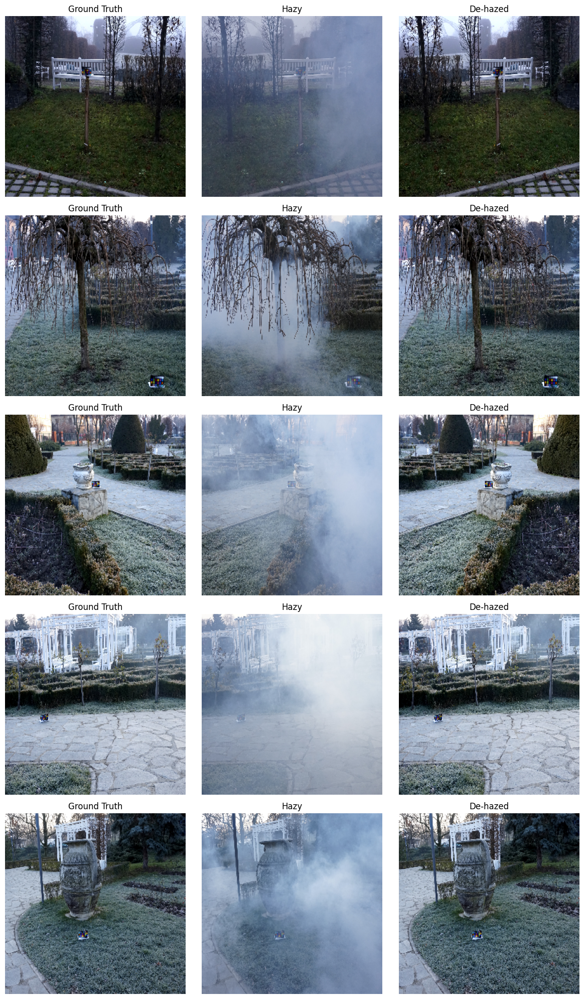

In [ ]:
import matplotlib.pyplot as plt
import cv2

# Replace these with your actual data
gt_samples = gt  # List of Ground Truth images
hazy_samples = hazy  # List of Hazy images
clear_samples = clear  # List of De-hazed images

num_samples = 5

plt.figure(figsize=(12, 4 * num_samples))  # Adjust the figure size as needed

for i in range(num_samples):
    # Plot the Ground Truth image
    plt.subplot(num_samples, 3, 3 * i + 1)
    plt.title("Ground Truth")
    plt.imshow(cv2.cvtColor(gt_samples[i], cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Plot the Hazy image
    plt.subplot(num_samples, 3, 3 * i + 2)
    plt.title("Hazy")
    plt.imshow(0.5 * hazy_samples[i] + 0.5)
    plt.axis('off')

    # Plot the De-hazed image
    plt.subplot(num_samples, 3, 3 * i + 3)
    plt.title("De-hazed")
    plt.imshow(0.5 * clear_samples[i] + 0.5)
    plt.axis('off')

plt.tight_layout()  # To prevent overlapping of subplots
plt.show()


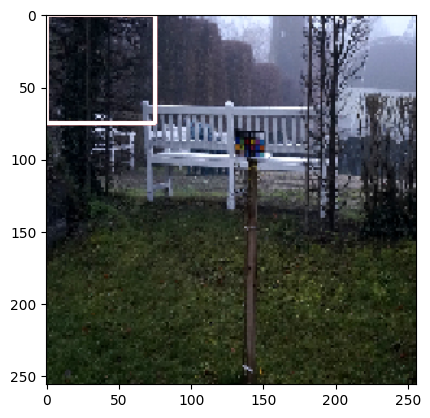

In [ ]:
# Display the image with the bounding box
import cv2
import matplotlib.pyplot as plt
#Path to where the image is stored
image_path=r'/content/drive/MyDrive/NH_PSNR/P/clear.png'
# Load the image
image = plt.imread(image_path)

#Define coordinate of rectangle corners
x_min=0
x_max=75
y_min=0
y_max=75

colour = (255, 0, 0)  # Green color for the bounding box (BGR format)
thickness = 2       # Thickness of the bounding box lines

cv2.rectangle(image, (x_min, y_min), (x_max, y_max), colour, thickness) #Draw the bounding box on the image using the 'rectangle' function

# Display the image with the bounding box
plt.imshow(image)